In [18]:
from goes2go import GOES

In [19]:
# different available products 
# https://github.com/blaylockbk/goes2go/blob/main/goes2go/product_table.txt

In [20]:
import pandas as pd

In [21]:
time_of_interest = pd.Timestamp.now(tz='UTC')
print(time_of_interest)

rgb_ds = GOES().latest()

2024-03-06 23:09:11.644677+00:00
 👮🏻‍♂️ File already exists. Do not overwrite: /home/john/data/noaa-goes16/ABI-L2-MCMIPC/2024/066/23/OR_ABI-L2-MCMIPC-M6_G16_s20240662301171_e20240662303544_c20240662304066.nc
📦 Finished downloading [1] files to [/home/john/data/noaa-goes16/ABI-L2-MCMIPC].
📖💽 Reading (1/1) file from LOCAL COPY [/home/john/data/noaa-goes16/ABI-L2-MCMIPC/2024/066/23/OR_ABI-L2-MCMIPC-M6_G16_s20240662301171_e20240662303544_c20240662304066.nc]. 

/home/john/Documents/fixing_metar/venv/lib/python3.10/site-packages/goes2go/data.py:138: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  DATES = pd.date_range(f"{start:%Y-%m-%d %H:00}", f"{end:%Y-%m-%d %H:00}", freq="1H")


📚 Finished reading [1] files into xarray.Dataset.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      


/home/john/Documents/fixing_metar/venv/lib/python3.10/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


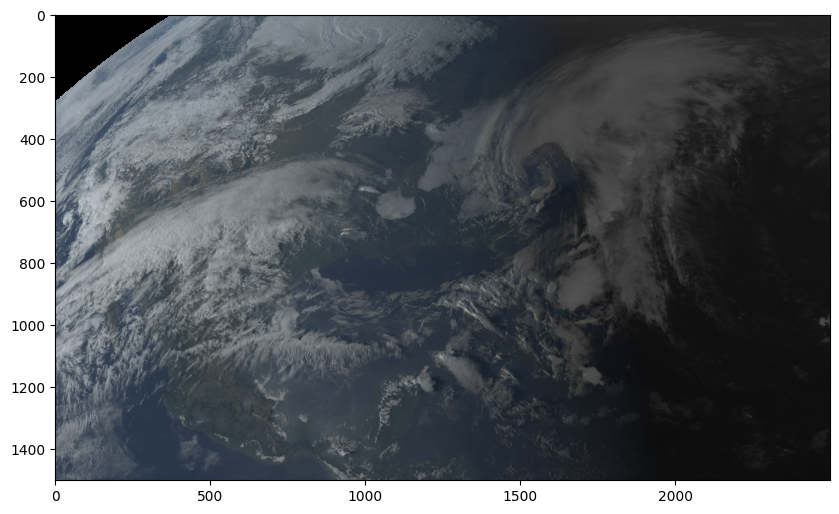

In [22]:
# let's plot the rgb image
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(rgb_ds.rgb.TrueColor())

In [23]:
import cartopy

/home/john/Documents/fixing_metar/venv/lib/python3.10/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


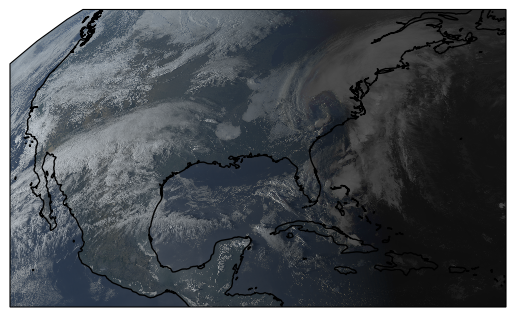

In [24]:
# can use cartopy to plot the image on a map
ax = plt.subplot(projection=rgb_ds.rgb.crs)

ax.imshow(rgb_ds.rgb.TrueColor(), **rgb_ds.rgb.imshow_kwargs)
ax.coastlines()

In [25]:
# plol all rgb
rgb_products = [i for i in dir(rgb_ds.rgb) if i[0].isupper()]
rgb_products

['AirMass',
 'AirMassTropical',
 'AirMassTropicalPac',
 'Ash',
 'DayCloudConvection',
 'DayCloudPhase',
 'DayConvection',
 'DayLandCloud',
 'DayLandCloudFire',
 'DaySnowFog',
 'DifferentialWaterVapor',
 'Dust',
 'FireTemperature',
 'NaturalColor',
 'NightFogDifference',
 'NighttimeMicrophysics',
 'NormalizedBurnRatio',
 'RocketPlume',
 'SeaSpray',
 'SplitWindowDifference',
 'SulfurDioxide',
 'TrueColor',
 'WaterVapor']

In [26]:
# Examples using EasyMap https://github.com/blaylockbk/Carpenter_Workshop/blob/main/notebooks/demo_cartopy_tools.ipynb

/home/john/Documents/fixing_metar/venv/lib/python3.10/site-packages/goes2go/accessors.py:1250: UserWarning: THE `NormalizedBurnRatio` FUNCTION IS NOT FULLY DEVELOPED. NEED MORE INFO.
  warnings.warn(
/home/john/Documents/fixing_metar/venv/lib/python3.10/site-packages/goes2go/accessors.py:1258: RuntimeWarning: invalid value encountered in divide
  data = (C3 - C6) / (C3 + C6)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/tmp/ipykernel_197297/873323784.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(15, 12))
/home/john/Documents/fixing_metar/venv/lib/python3.10/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value enco

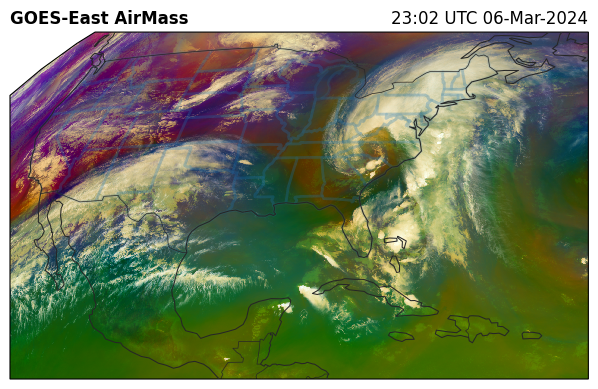

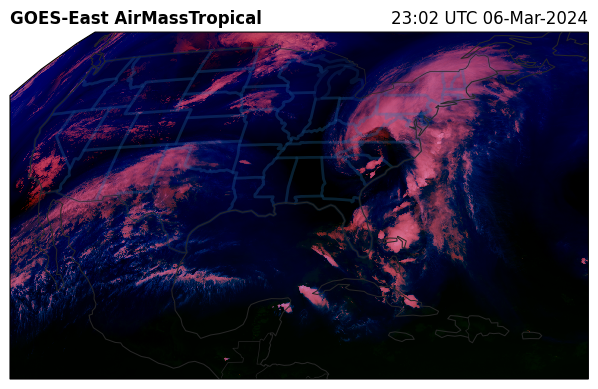

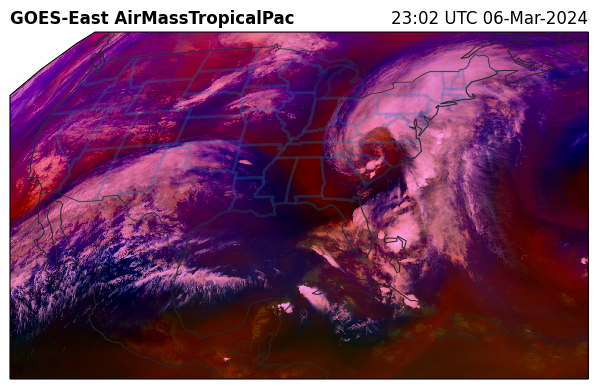

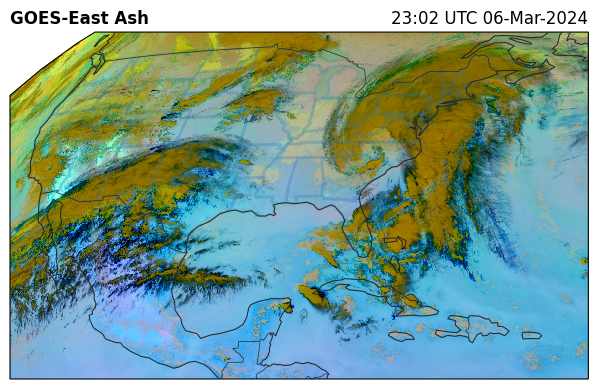

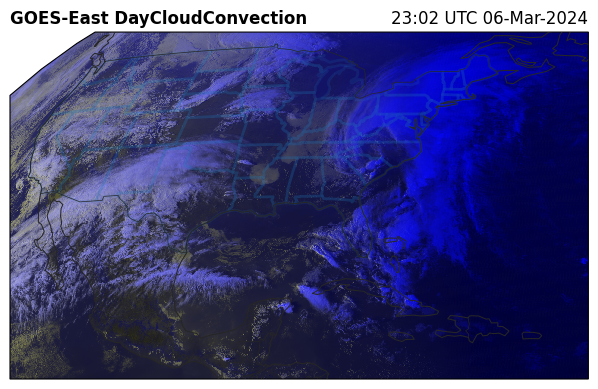

...

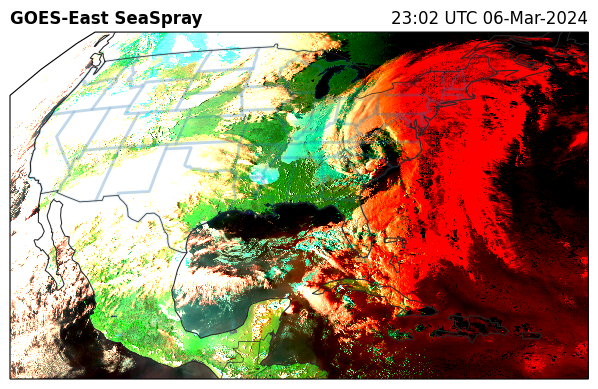

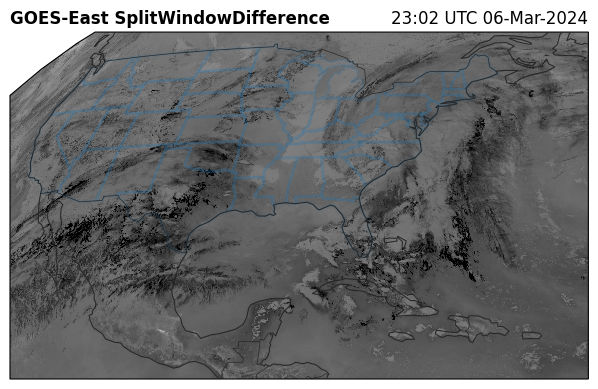

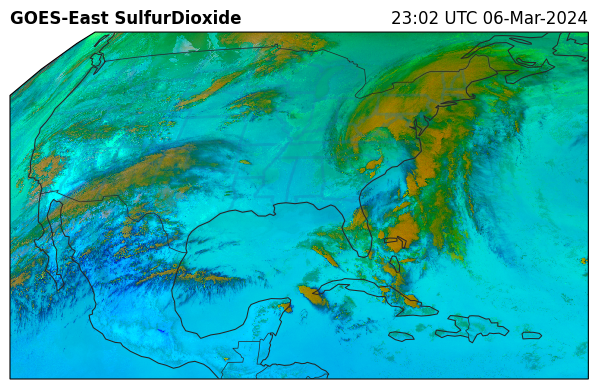

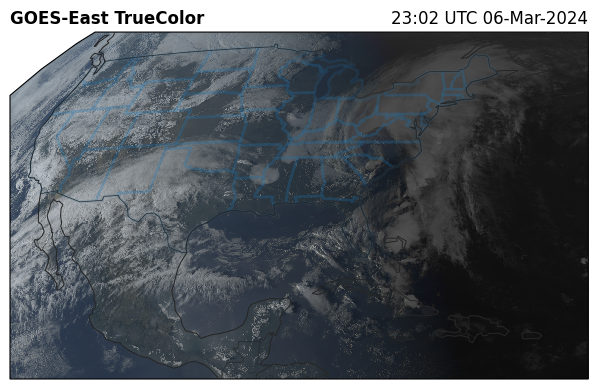

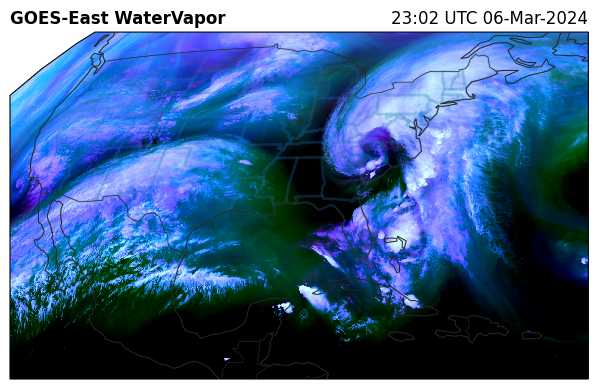

In [27]:
# need his toolbox module
from toolbox import EasyMap, pc, ccrs

for product in rgb_products:
    fig = plt.figure(figsize=(15, 12))
    ax16 = fig.add_subplot(1, 2, 2, projection=rgb_ds.rgb.crs)

    for ax, G in zip([ax16],[rgb_ds]):
        RGB = getattr(G.rgb, product)()

        (EasyMap(ax=ax)
    .STATES(edgecolor="tab:blue", linewidth=2)
    .BORDERS())
        ax.imshow(RGB, **G.rgb.imshow_kwargs)
        ax.set_title(f"{G.orbital_slot} {product}", loc="left", fontweight="bold")
        ax.set_title(f"{G.t.dt.strftime('%H:%M UTC %d-%b-%Y').item()}", loc="right")
    plt.subplots_adjust(wspace=0.01)
    # plt.savefig(f"../docs/_static/{product}", bbox_inches="tight")

In [28]:
# lets work with a ds without any rgb
# total precipitable water
G = GOES(satellite=16, product='ABI-L2-TPW', domain = "C")
G

╭───────────────────────────────╌┄┈
│ 🌎 GOES Object   
│ ───────────────
│  self.satellite='noaa-goes16'
│  self.product='ABI-L2-TPWC'
│  self.domain='C'
│  self.bands=None
│  self.description='Advanced Baseline Imager Level 2 Total Precipitable Water CONUS'
╰───────────────────────────────╌┄┈

In [29]:
# get the nearest time
ds = G.latest()
ds

/home/john/Documents/fixing_metar/venv/lib/python3.10/site-packages/goes2go/data.py:138: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  DATES = pd.date_range(f"{start:%Y-%m-%d %H:00}", f"{end:%Y-%m-%d %H:00}", freq="1H")


📦 Finished downloading [1] files to [/home/john/data/noaa-goes16/ABI-L2-TPWC].
📚 Finished reading [1] files into xarray.Dataset.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        

<xarray.Dataset> Size: 2MB
Dimensions:                                           (y: 300, x: 500,
                                                       number_of_time_bounds: 2,
                                                       number_of_image_bounds: 2,
                                                       number_of_LZA_bounds: 2,
                                                       number_of_SZA_bounds: 2,
                                                       number_of_lat_bounds: 2,
                                                       sounding_emissive_bands: 7)
Coordinates: (12/15)
    t                                                 datetime64[ns] 8B 2024-...
  * y                                                 (y) float64 2kB 0.1281 ...
  * x                                                 (x) float64 4kB -0.1012...
    y_image                                           float32 4B 0.08624
    x_image                                           float32 4B -0.03136
    retrieval_local_zenith_angle                      float32 4B 80.0
    ...                                                ...
    sounding_emissive_wavelengths                     (sounding_emissive_bands) float32 28B ...
    sounding_emissive_band_ids                        (sounding_emissive_bands) int8 7B ...
    dataset_name                                      <U72 288B 'OR_ABI-L2-TP...
    date_created                                      <U22 88B '2024-03-06T23...
    time_coverage_start                               <U22 88B '2024-03-06T23...
    time_coverage_end                                 <U22 88B '2024-03-06T23...
Dimensions without coordinates: number_of_time_bounds, number_of_image_bounds,
                                number_of_LZA_bounds, number_of_SZA_bounds,
                                number_of_lat_bounds, sounding_emissive_bands
Data variables: (12/30)
    TPW                                               (y, x) float32 600kB na...
    DQF_Overall                                       (y, x) float32 600kB 1....
    DQF_Retrieval                                     (y, x) float32 600kB na...
    DQF_SkinTemp                                      (y, x) float32 600kB na...
    time_bounds                                       (number_of_time_bounds) datetime64[ns] 16B ...
    goes_imager_projection                            int32 4B -2147483647
    ...                                                ...
    percent_uncorrectable_L0_errors                   float32 4B 0.0
    percent_uncorrectable_GRB_errors                  float32 4B 0.0
    total_attempted_retrievals                        float64 8B 6.866e+04
    mean_obs_modeled_diff_sounding_emissive_bands     (sounding_emissive_bands) float32 28B ...
    std_dev_obs_modeled_diff_sounding_emissive_bands  (sounding_emissive_bands) float32 28B ...
    filename                                          <U108 432B 'noaa-goes16...
Attributes: (12/26)
    naming_authority:          gov.nesdis.noaa
    Conventions:               CF-1.7
    Metadata_Conventions:      Unidata Dataset Discovery v1.0
    standard_name_vocabulary:  CF Standard Name Table (v35, 20 July 2016)
    institution:               DOC/NOAA/NESDIS > U.S. Department of Commerce,...
    project:                   GOES
    ...                        ...
    processing_level:          National Aeronautics and Space Administration ...
    cdm_data_type:             Image
    timeline_id:               ABI Mode 6
    production_data_source:    Realtime
    id:                        c7e42848-8853-40db-9feb-92e9be48bfb7
    path:                      ['noaa-goes16/ABI-L2-TPWC/2024/066/23/OR_ABI-L...

In [30]:
# need to extract the crs, x, y
from goes2go.tools import abi_crs
crs, x, y = abi_crs(ds, "TPW")
crs

<Projected CRS: +proj=geos +a=6378137.0 +b=6356752.31414 +rf=298.2 ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unknown
- method: Geostationary Satellite (Sweep X)
Datum: Unknown based on GRS 1980 ellipsoid
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

Text(0.5, 1.0, '23:02 UTC 06 Mar 2024')

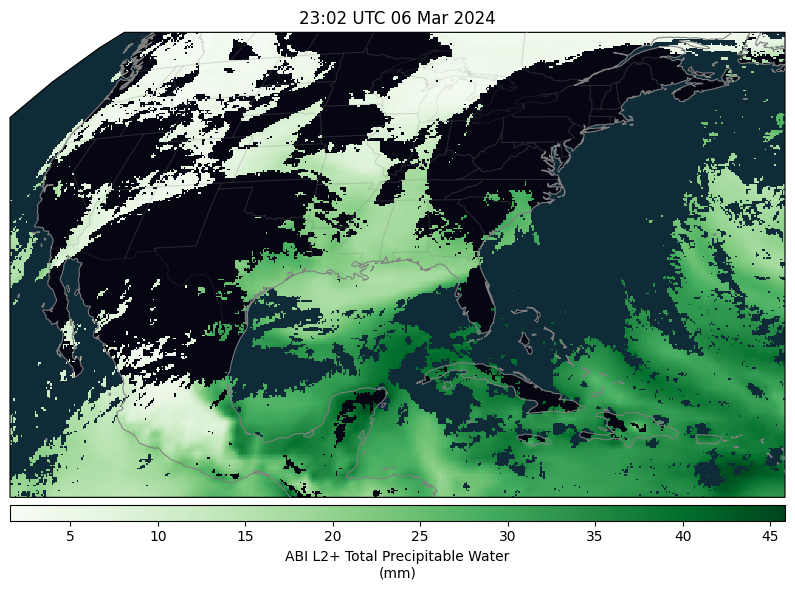

In [31]:
ax = EasyMap("50m", crs=crs, figsize=(10, 10), dark=True).STATES().OCEAN().LAND().ax
c = ax.pcolormesh(x, y, ds.TPW, transform=crs, cmap="Greens")

# add a colorbar
fig = plt.gcf()
cbar = fig.colorbar(c, ax=ax, orientation="horizontal", pad=0.01, aspect=50, label=f"{ds.TPW.long_name}\n({ds.TPW.units})")

ax.set_title(f"{ds.t.dt.strftime('%H:%M UTC %d %b %Y').item()}")

In [33]:
# lets try with temperature
G = GOES(satellite=16, product='ABI-L2-LST', domain = "C")
ds = G.latest()
ds

/home/john/Documents/fixing_metar/venv/lib/python3.10/site-packages/goes2go/data.py:138: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  DATES = pd.date_range(f"{start:%Y-%m-%d %H:00}", f"{end:%Y-%m-%d %H:00}", freq="1H")


📦 Finished downloading [1] files to [/home/john/data/noaa-goes16/ABI-L2-LSTC].
📚 Finished reading [1] files into xarray.Dataset.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        

<xarray.Dataset> Size: 45MB
Dimensions:                                 (y: 1500, x: 2500,
                                             number_of_time_bounds: 2,
                                             number_of_image_bounds: 2,
                                             number_of_LZA_bounds: 2,
                                             number_of_SZA_bounds: 2)
Coordinates:
  * y                                       (y) float64 12kB 0.1282 ... 0.04427
  * x                                       (x) float64 20kB -0.1013 ... 0.03861
    t                                       datetime64[ns] 8B 2024-03-06T23:0...
    y_image                                 float32 4B 0.08624
    x_image                                 float32 4B -0.03136
    retrieval_local_zenith_angle            float32 4B 85.0
    quantitative_local_zenith_angle         float32 4B 55.0
    solar_zenith_angle                      float32 4B 180.0
    dataset_name                            <U72 288B 'OR_ABI-L2-LSTC-M6_G16_...
    date_created                            <U22 88B '2024-03-06T23:07:01.6Z'
    time_coverage_start                     <U22 88B '2024-03-06T23:01:17.1Z'
    time_coverage_end                       <U22 88B '2024-03-06T23:03:54.4Z'
Dimensions without coordinates: number_of_time_bounds, number_of_image_bounds,
                                number_of_LZA_bounds, number_of_SZA_bounds
Data variables: (12/28)
    LST                                     (y, x) float32 15MB nan nan ... nan
    DQF                                     (y, x) float32 15MB nan nan ... 3.0
    PQI                                     (y, x) float32 15MB nan ... 1.763...
    time_bounds                             (number_of_time_bounds) datetime64[ns] 16B ...
    goes_imager_projection                  int32 4B -2147483647
    y_image_bounds                          (number_of_image_bounds) float32 8B ...
    ...                                      ...
    algorithm_dynamic_input_data_container  int32 4B -2147483647
    processing_parm_version_container       int32 4B -2147483647
    algorithm_product_version_container     int32 4B -2147483647
    percent_uncorrectable_GRB_errors        float32 4B 0.0
    percent_uncorrectable_L0_errors         float32 4B 0.0
    filename                                <U108 432B 'noaa-goes16/ABI-L2-LS...
Attributes: (12/26)
    naming_authority:          gov.nesdis.noaa
    Conventions:               CF-1.7
    Metadata_Conventions:      Unidata Dataset Discovery v1.0
    standard_name_vocabulary:  CF Standard Name Table (v35, 20 July 2016)
    institution:               DOC/NOAA/NESDIS > U.S. Department of Commerce,...
    project:                   GOES
    ...                        ...
    processing_level:          National Aeronautics and Space Administration ...
    cdm_data_type:             Image
    timeline_id:               ABI Mode 6
    production_data_source:    Realtime
    id:                        6ec85b4f-fd13-4d1d-a6d6-bdbc547ef314
    path:                      ['noaa-goes16/ABI-L2-LSTC/2024/066/23/OR_ABI-L...

In [34]:
# need to extract the crs, x, y
crs, x, y = abi_crs(ds, "LST")
crs

<Projected CRS: +proj=geos +a=6378137.0 +b=6356752.31414 +rf=298.2 ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unknown
- method: Geostationary Satellite (Sweep X)
Datum: Unknown based on GRS 1980 ellipsoid
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

Text(0.5, 1.0, '23:02 UTC 06 Mar 2024')

/home/john/Documents/fixing_metar/venv/lib/python3.10/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/home/john/Documents/fixing_metar/venv/lib/python3.10/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/home/john/Documents/fixing_metar/venv/lib/python3.10/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


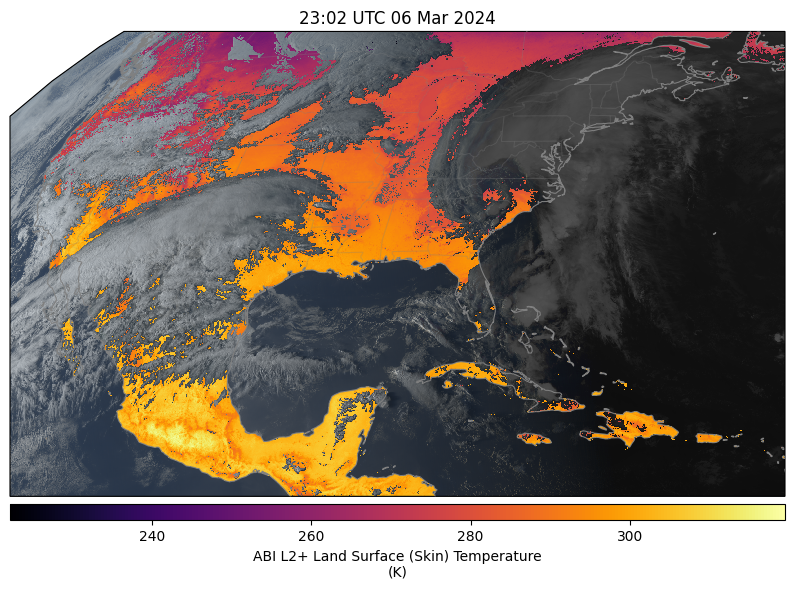

In [35]:
ax = EasyMap("50m", crs=crs, figsize=(10, 10), dark=True).STATES().OCEAN().LAND().ax

c = ax.pcolormesh(x, y, ds.LST, transform=crs, cmap="inferno")

# ax.set_extent([-85, -75, 35, 45])

ax.imshow(rgb_ds.rgb.TrueColor(), **rgb_ds.rgb.imshow_kwargs)

# add a colorbar
fig = plt.gcf()
cbar = fig.colorbar(c, ax=ax, orientation="horizontal", pad=0.01, aspect=50, label=f"{ds.LST.long_name}\n({ds.LST.units})")

ax.set_title(f"{ds.t.dt.strftime('%H:%M UTC %d %b %Y').item()}")